# Simplified detection of urban types

Example adapted from the [SDSC 2021 Workshop](https://github.com/martinfleis/sdsc21-workshop) led by Martin Fleischmann. You can see the recording of the workshop on [YouTube](https://www.youtube.com/watch?v=itUX56Ks1UE).

This example illustrates the potential of morphometrics captured by `momepy` in capturing the structure of cities. We will pick a town, fetch its data from the OpenStreetMap, and analyse it to detect individual types of urban structure within it.

This method is only illustrative and is based on the more extensive one published by Fleischmann et al. (2021) available from [https://github.com/martinfleis/numerical-taxonomy-paper](https://github.com/martinfleis/numerical-taxonomy-paper).

> Fleischmann M, Feliciotti A, Romice O and Porta S (2021) Methodological Foundation of a Numerical Taxonomy of Urban Form. Environment and Planning B: Urban Analytics and City Science, doi: 10.1177/23998083211059835

It depends on the following packages:

```
- momepy
- osmnx
- clustergram
- bokeh
- scikit-learn
- geopy
- ipywidgets
```


In [1]:
import geopandas as gpd
import libpysal
import matplotlib.pyplot as plt
import momepy

import pandas
from bokeh.io import output_notebook
from bokeh.plotting import show
from clustergram import Clustergram

output_notebook()

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading BokehJS ...

Pick a place, ideally a town with a good coverage in OpenStreetMap and its local CRS.

In [2]:
place = "Znojmo, Czechia"
local_crs = 5514

We can interactively explore the place we just selected.

In [4]:
gpd.tools.geocode(place).explore()

ModuleNotFoundError: No module named 'geopy'

## Input data

We can use ``OSMnx`` to quickly download data from OpenStreetMap. If you intend to download larger areas, we recommend using ``pyrosm`` instead.

### Buildings

In [5]:
buildings = osmnx.features_from_place(place, tags={"building": True})
buildings.head()

NameError: name 'osmnx' is not defined

<Axes: >

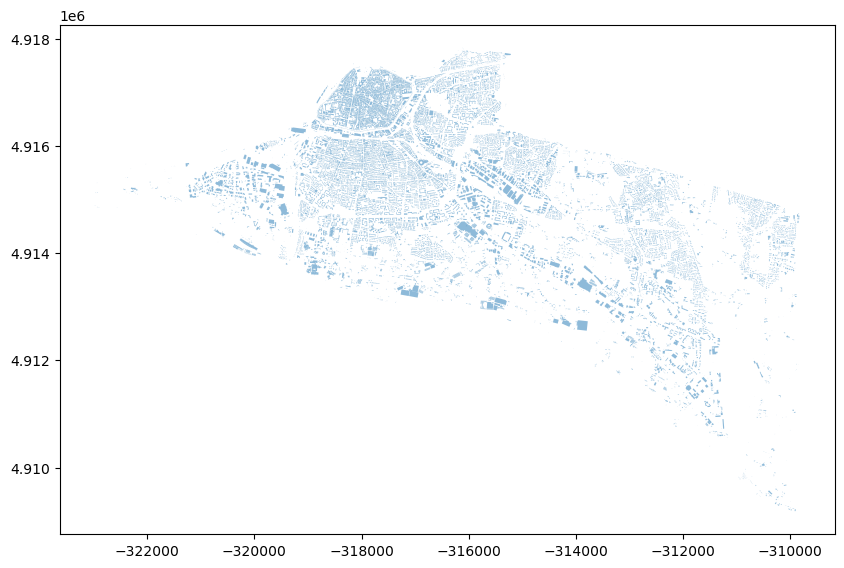

In [11]:
buildings.plot(figsize=(10, 10), alpha=0.5)

The OSM input may need a bit of cleaning to ensure only proper polygons are kept.

In [6]:
buildings.geom_type.value_counts()

NameError: name 'buildings' is not defined

## Read buildings data

In [2]:
path = r"C:\Users\edoar\OneDrive\Desktop\test\bl2.shp"
layer = "bl2"
buildings = gpd.read_file(path, layer=layer)

In [3]:
buildings = buildings.explode(index_parts=False).reset_index(drop=True)
buildings = buildings[buildings.geom_type == "Polygon"].reset_index(drop=True)

And we should re-project the data from WGS84 to the local projection in meters (momepy default values assume meters not feet or degrees). We will also drop unnecessary columns.

In [4]:
buildings = buildings[["geometry", "height"]].to_crs(epsg=32633)
buildings.head()

,geometry,height
0,"POLYGON ((-310221.405 4914863.983, -310225.022...",1.707255
1,"POLYGON ((-310225.022 4914864.396, -310221.405...",1.790354
2,"POLYGON ((-310222.394 4914856.896, -310222.877...",4.849935
3,"POLYGON ((-310233.408 4914817.823, -310221.644...",6.187273
4,"POLYGON ((-310200.44 4914883.629, -310194.169 ...",7.221760


### Streets

Similar operations are done with streets.

In [8]:
osm_graph = osmnx.graph_from_place(place, network_type="drive")
osm_graph = osmnx.projection.project_graph(osm_graph, to_crs=local_crs)
streets = osmnx.graph_to_gdfs(
    osmnx.convert.to_undirected(osm_graph),
    nodes=False,
    edges=True,
    node_geometry=False,
    fill_edge_geometry=True,
).reset_index(drop=True)
streets.head()

/Users/martin/miniforge3/envs/momepy/lib/python3.11/site-packages/osmnx/graph.py:392: FutureWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  polygon = gdf_place["geometry"].unary_union


,osmid,ref,name,highway,maxspeed,oneway,reversed,length,from,to,geometry,lanes,bridge,junction,width,tunnel,access
0,33733060,361,Přímětická,secondary,50,False,True,24.574,639231391,74103628,"LINESTRING (-643229.639 -1192872.949, -643239....",NaN,NaN,NaN,NaN,NaN,NaN
1,33733060,361,Přímětická,secondary,50,False,False,60.354,3775990798,74103628,"LINESTRING (-643236.395 -1192790.304, -643237....",NaN,NaN,NaN,NaN,NaN,NaN
2,50313252,NaN,Raisova,residential,NaN,True,False,74.763,639231413,74103628,"LINESTRING (-643291.344 -1192797.012, -643288....",NaN,NaN,NaN,NaN,NaN,NaN
3,33733060,361,Přímětická,secondary,50,False,True,54.260,74142638,639231391,"LINESTRING (-643205.434 -1192921.533, -643219....",NaN,NaN,NaN,NaN,NaN,NaN
4,50313241,NaN,Mičurinova,residential,NaN,True,False,101.376,639231391,639231314,"LINESTRING (-643229.639 -1192872.949, -643233....",NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
path = r"C:\Users\edoar\OneDrive\Desktop\test\Avignon_Roads.gpkg"
layer = "Avignon_roads"
streets = gpd.read_file(path, layer=layer)

We can also do some preprocessing using momepy to ensure we have proper network topology.

In [6]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\utils.py:351: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


In [7]:
streets.head()

,geometry
0,"LINESTRING (4.75769 43.93375, 4.75806 43.93349..."
1,"LINESTRING (4.74943 43.92585, 4.74936 43.92527..."
2,"LINESTRING (4.75067 43.92692, 4.75053 43.92689..."
3,"LINESTRING (4.75151 43.92678, 4.75141 43.92683..."
4,"LINESTRING (4.75034 43.9291, 4.75012 43.929, 4..."


In [8]:
streets = streets.to_crs(epsg=32633)

## Generated data

### Tessellation

Given building footprints:

![blg](http://docs.momepy.org/en/stable/_images/user_guide_elements_tessellation_3_0.png)

We can generate a spatial unit using morphological tessellation:

![tess](https://docs.momepy.org/en/stable/_images/user_guide_elements_tessellation_9_0.png)

In [9]:
limit = momepy.buffered_limit(buildings, "adaptive")

tessellation = momepy.morphological_tessellation(buildings, clip=limit)

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\libpysal\graph\base.py:1375: UserWarning: The numba package is used extensively in this module to accelerate the computation of graphs. Without numba, these computations may become unduly slow on large data.
  head, tail, weights = _gabriel(


OpenStreetMap data are often problematic due to low quality of some polygons. If some collapse, we get a mismatch between the length of buildings and the length of polygons.

In [10]:
collapsed, _ = momepy.verify_tessellation(tessellation, buildings)

C:\Users\edoar\AppData\Local\Temp\ipykernel_29216\3509021287.py:1: UserWarning: Tessellation does not fully match buildings. 50 element(s) disappeared during generation. Index of the affected elements: Index([  150,   152,   157,   167,  2101,  2113,  2453,  2459,  2460,  2464,
        2471,  3064,  3403,  3454,  4234,  4274,  4320,  4328,  4867,  6019,
        6027,  6162,  6785,  8624, 10916, 11527, 12041, 12728, 12732, 12984,
       14597, 15646, 15712, 15937, 16948, 21302, 22019, 24699, 24736, 27323,
       29524, 29627, 32854, 32857, 32860, 32956, 34958, 35324, 36557, 37136],
      dtype='int64').
  collapsed, _ = momepy.verify_tessellation(tessellation, buildings)
C:\Users\edoar\AppData\Local\Temp\ipykernel_29216\3509021287.py:1: UserWarning: Tessellation contains MultiPolygon elements. Initial objects should  be edited. Index of affected elements: [806, 957, 1073, 1332, 1407, 1436, 1923, 3027, 3196, 3263, 3277, 3363, 3408, 3416, 3526, 3625, 3660, 3665, 3945, 4046, 4167, 4475, 47

Better to drop affected buildings and re-create tessellation.

In [11]:
buildings = buildings.drop(collapsed)
limit = momepy.buffered_limit(buildings, "adaptive")
tessellation = momepy.morphological_tessellation(buildings, clip=limit)

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\libpysal\graph\base.py:1375: UserWarning: The numba package is used extensively in this module to accelerate the computation of graphs. Without numba, these computations may become unduly slow on large data.
  head, tail, weights = _gabriel(


Check the result.

In [12]:
tessellation.shape[0] == buildings.shape[0]

True

### Link streets

Link unique IDs of streets to buildings and tessellation cells based on the nearest neighbor join.

In [13]:
buildings["street_index"] = momepy.get_nearest_street(
    buildings, streets, max_distance=100
)
buildings

,geometry,height,street_index
0,"POLYGON ((-310221.405 4914863.983, -310225.022...",1.707255,20759.0
1,"POLYGON ((-310225.022 4914864.396, -310221.405...",1.790354,20759.0
2,"POLYGON ((-310222.394 4914856.896, -310222.877...",4.849935,20759.0
3,"POLYGON ((-310233.408 4914817.823, -310221.644...",6.187273,20759.0
4,"POLYGON ((-310200.44 4914883.629, -310194.169 ...",7.221760,20759.0
...,...,...,...
39331,"POLYGON ((-322204.684 4915171.714, -322192.629...",6.164693,4851.0
39332,"POLYGON ((-322936.215 4915308.231, -322931.248...",0.047072,4.0
39333,"POLYGON ((-322966.624 4915131.783, -322965.943...",0.022327,4.0
39334,"POLYGON ((-322959.097 4915121.693, -322958.447...",0.017826,4.0


Aattach the network index to the tessellation as well.

In [14]:
tessellation["street_index"] = buildings["street_index"]

## Measure

Measure individual morphometric characters. For details see the User Guide and the API reference.

### Dimensions

In [15]:
buildings['floor_area'] = (buildings["height"] / 3.5) * buildings.area

In [16]:
buildings["CoA"] = momepy.courtyard_area(buildings)
buildings["Per"] = momepy.perimeter_wall(buildings)

buildings["area"] = buildings.area
buildings["Vol"] = momepy.volume(buildings["area"], buildings["height"])


In [17]:


streets["length"] = streets.length

In [18]:
tessellation["tess_area"] = tessellation.area
tessellation["tess_LAL"] = momepy.longest_axis_length(tessellation)

### Shape

In [19]:
buildings["eri"] = momepy.equivalent_rectangular_index(buildings)
buildings["elongation"] = momepy.elongation(buildings)
buildings["CCo"] = momepy.circular_compactness(buildings)
buildings["VFR"] = momepy.facade_ratio(buildings)
buildings["Cor"] = momepy.corners(buildings)
buildings["Squ"] = momepy.squareness(buildings)
buildings["FF"] = momepy.form_factor(buildings, buildings["height"])
buildings["CCM"] = momepy.centroid_corner_distance(buildings).mean()
buildings["CCS"] = momepy.centroid_corner_distance(buildings).std()

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_shape.py:879: RuntimeWarning: invalid value encountered in arccos
  angles = np.arccos(cosine_angle)
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_shape.py:879: RuntimeWarning: invalid value encountered in arccos
  angles = np.arccos(cosine_angle)
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_shape.py:569: RuntimeWarning: Mean of empty slice
  return np.nanmean(np.abs(90 - degrees[true_angles]))
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_shape.py:879: RuntimeWarning: invalid value encountered in arccos
  angles = np.arccos(cosine_angle)
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_shape.py:726: RuntimeWarning: Mean of empty slice
  return Series({"mean": np.nanmean(dists), "std": np.nanstd(dists)})
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:2015: RuntimeWa

In [20]:
# List the columns you want to drop
columns_to_drop = ['CCM', 'CCS']

# Drop the columns in-place
buildings.drop(columns=columns_to_drop, inplace=True)

In [21]:
buildings

,geometry,height,street_index,floor_area,CoA,Per,area,Vol,eri,elongation,CCo,VFR,Cor,Squ,FF
0,"POLYGON ((-310221.405 4914863.983, -310225.022...",1.707255,20759.0,13.454617,0.0,92.067883,27.582961,47.091161,0.977683,0.447911,0.445729,1.186705,6,2.432193,5.158196
1,"POLYGON ((-310225.022 4914864.396, -310221.405...",1.790354,20759.0,12.355492,0.0,92.067883,24.154006,43.244224,0.962048,0.500601,0.486681,1.114658,6,2.233453,5.109480
2,"POLYGON ((-310222.394 4914856.896, -310222.877...",4.849935,20759.0,26.902508,0.0,92.067883,19.414441,94.158778,0.862747,0.477767,0.378960,0.889034,6,1.743814,6.055266
3,"POLYGON ((-310233.408 4914817.823, -310221.644...",6.187273,20759.0,305.827465,0.0,61.866431,172.999673,1070.396127,0.886919,0.557672,0.438216,2.796342,14,3.629208,5.311410
4,"POLYGON ((-310200.44 4914883.629, -310194.169 ...",7.221760,20759.0,313.720240,0.0,54.625646,152.043380,1098.020839,0.904097,0.902771,0.585230,2.783370,8,0.473362,5.135061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39331,"POLYGON ((-322204.684 4915171.714, -322192.629...",6.164693,4851.0,321.955700,0.0,232.935267,182.790120,1126.844951,0.852289,0.354339,0.290407,2.532302,8,0.371905,5.797361
39332,"POLYGON ((-322936.215 4915308.231, -322931.248...",0.047072,4.0,0.265304,0.0,18.803679,19.726335,0.928564,1.000280,0.505562,0.511750,1.049068,4,0.199912,21.655469
39333,"POLYGON ((-322966.624 4915131.783, -322965.943...",0.022327,4.0,0.236587,0.0,31.287625,37.087407,0.828055,1.000003,0.228838,0.276781,1.185370,4,0.041822,42.850689
39334,"POLYGON ((-322959.097 4915121.693, -322958.447...",0.017826,4.0,0.146122,0.0,25.056059,28.689205,0.511425,1.000052,0.317028,0.366713,1.145001,4,0.036578,45.558886


In [22]:
tessellation["tess_CCo"] = momepy.circular_compactness(tessellation)
tessellation["tess_ERI"] = momepy.equivalent_rectangular_index(tessellation)
tessellation["convexity"] = momepy.convexity(tessellation)
streets["linearity"] = momepy.linearity(streets)

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


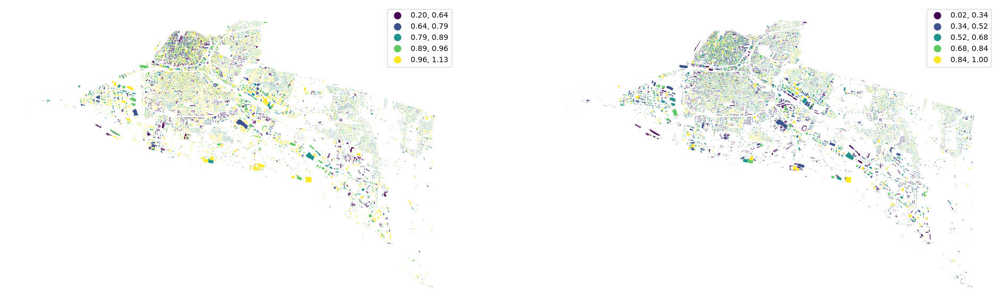

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("eri", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("elongation", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

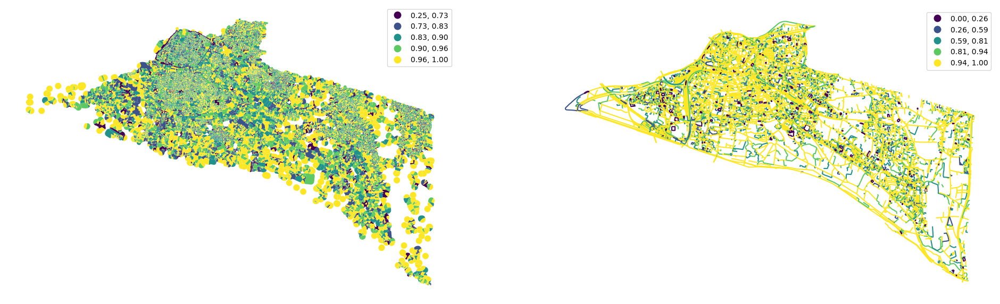

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("linearity", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

### Spatial distribution

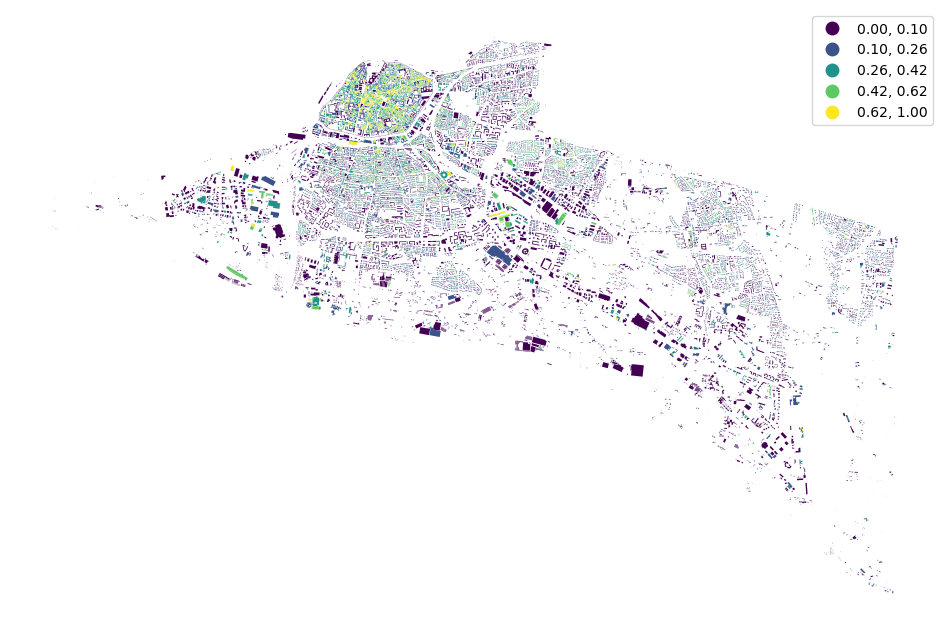

In [25]:
buildings["shared_walls"] = momepy.shared_walls(buildings) / buildings.length
buildings.plot(
    "shared_walls", figsize=(12, 12), scheme="natural_breaks", legend=True
).set_axis_off()

Generate spatial graph using `libpysal`.

In [26]:
queen_1 = libpysal.graph.Graph.build_contiguity(tessellation, rook=False)

In [27]:
tessellation["neighbors"] = momepy.neighbors(
    tessellation, queen_1, weighted=True
)
tessellation["covered_area"] = queen_1.describe(tessellation.area)["sum"]
buildings["neighbor_distance"] = momepy.neighbor_distance(buildings, queen_1)

C:\Users\edoar\AppData\Local\Temp\ipykernel_29216\2369634746.py:4: UserWarning: The numba package is used extensively in this module to accelerate the computation of graphs. Without numba, these computations may become unduly slow on large data.
  tessellation["covered_area"] = queen_1.describe(tessellation.area)["sum"]


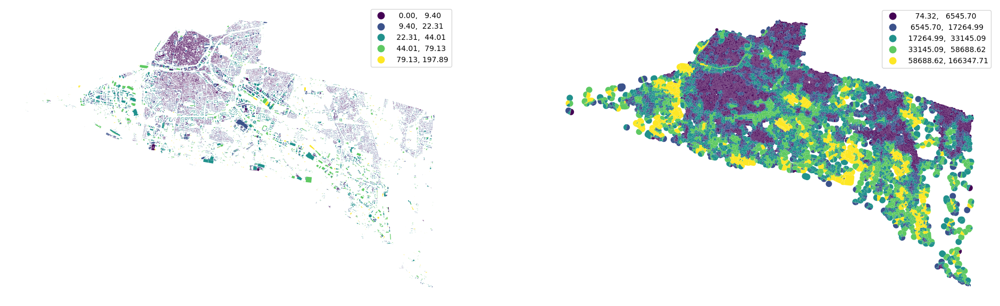

In [28]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot(
    "neighbor_distance", ax=ax[0], scheme="natural_breaks", legend=True
)
tessellation.plot(
    "covered_area", ax=ax[1], scheme="natural_breaks", legend=True
)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [29]:
queen_3 = queen_1.higher_order(3)
buildings_q1 = libpysal.graph.Graph.build_contiguity(buildings, rook=False)

buildings["interbuilding_distance"] = momepy.mean_interbuilding_distance(
    buildings, queen_1, queen_3
)
buildings["adjacency"] = momepy.building_adjacency(buildings_q1, queen_3)

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_distribution.py:375: RuntimeWarning: invalid value encountered in scalar divide
  mean_distances[i] = sub_matrix.sum() / sub_matrix.nnz


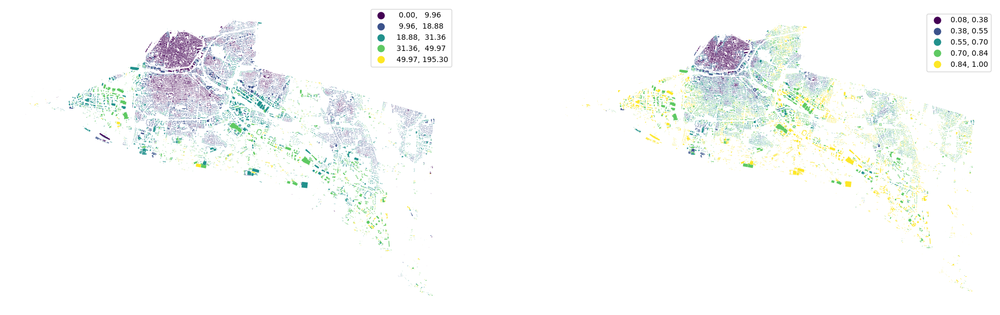

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot(
    "interbuilding_distance", ax=ax[0], scheme="natural_breaks", legend=True
)
buildings.plot("adjacency", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [31]:
profile = momepy.street_profile(streets, buildings, height= buildings["height"])
streets[profile.columns] = profile

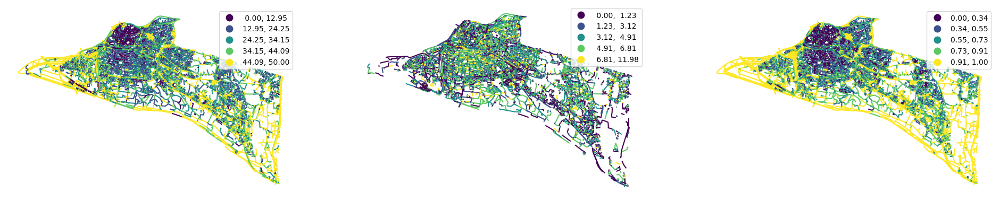

In [32]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

streets.plot("width", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("width_deviation", ax=ax[1], scheme="natural_breaks", legend=True)
streets.plot("openness", ax=ax[2], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

### Intensity

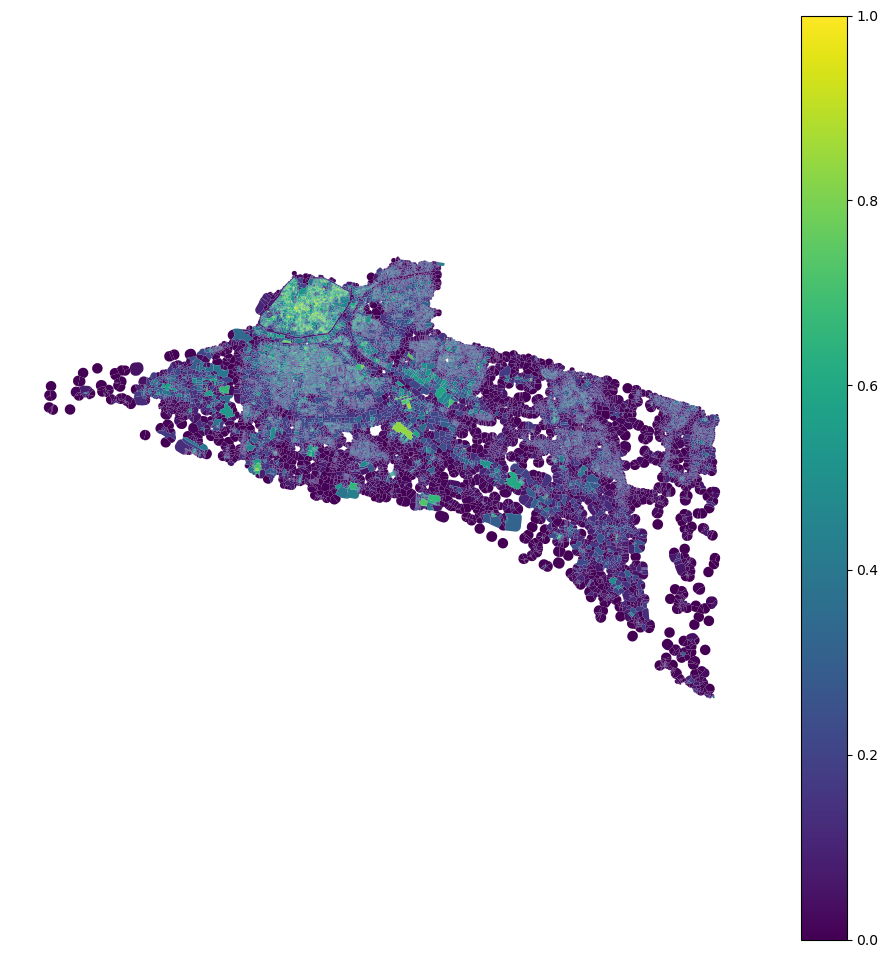

In [33]:
tessellation["car"] = buildings.area / tessellation.area
tessellation.plot(
    "car", figsize=(12, 12), vmin=0, vmax=1, legend=True
).set_axis_off()

### Connectivity

In [34]:
graph = momepy.gdf_to_nx(streets)
graph = momepy.node_degree(graph)
graph = momepy.closeness_centrality(graph, radius=400, distance="mm_len")
graph = momepy.meshedness(graph, radius=400, distance="mm_len")


100%|██████████| 17179/17179 [01:16<00:00, 223.72it/s]


In [35]:
graph = momepy.cds_length(graph, radius=3, name="ldsCDL", verbose=False)
graph = momepy.clustering(graph, name="clusering")
graph = momepy.mean_node_dist(graph, name="mtdMDi", verbose=False)

In [36]:
nodes, edges = momepy.nx_to_gdf(graph)

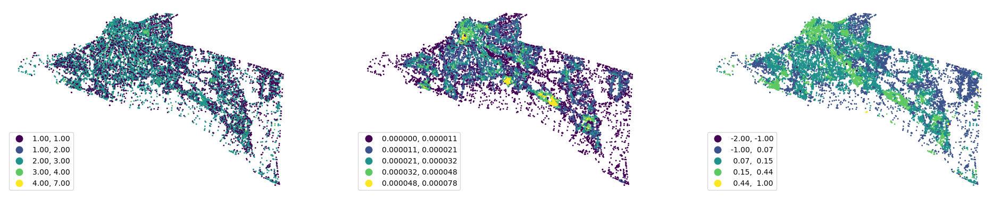

In [37]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

nodes.plot(
    "degree", ax=ax[0], scheme="natural_breaks", legend=True, markersize=1
)
nodes.plot(
    "closeness",
    ax=ax[1],
    scheme="natural_breaks",
    legend=True,
    markersize=1,
    legend_kwds={"fmt": "{:.6f}"},
)
nodes.plot(
    "meshedness", ax=ax[2], scheme="natural_breaks", legend=True, markersize=1
)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

In [38]:
buildings["edge_index"] = momepy.get_nearest_street(buildings, edges)
buildings["node_index"] = momepy.get_nearest_node(
    buildings, nodes, edges, buildings["edge_index"]
)

Link all data together (to tessellation cells or buildings).

In [39]:
tessellation.head()

,geometry,street_index,tess_area,tess_LAL,tess_CCo,tess_ERI,convexity,neighbors,covered_area,car
0,"POLYGON ((-310210.647 4914862.593, -310222.036...",20759.0,252.363517,26.384724,0.461564,0.952065,0.956534,0.073279,6278.108150,0.109299
1,"POLYGON ((-310233.12 4914860.451, -310233.348 ...",20759.0,160.370898,29.875469,0.228774,0.934603,0.934581,0.059034,4339.434112,0.150613
2,"POLYGON ((-310233.094 4914860.006, -310233.12 ...",20759.0,253.260759,39.618384,0.205440,0.885221,0.915638,0.046101,4675.263790,0.076658
3,"POLYGON ((-310188.924 4914780.233, -310204.772...",20759.0,2458.329841,74.095942,0.570114,1.037851,0.960361,0.040736,11537.672466,0.070373
4,"POLYGON ((-310197.397 4914840.508, -310198.303...",20759.0,3361.219326,80.028953,0.668210,1.072794,0.996880,0.027628,4058.192750,0.045235


In [40]:
buildings.head()

,geometry,height,street_index,floor_area,CoA,Per,area,Vol,eri,elongation,...,VFR,Cor,Squ,FF,shared_walls,neighbor_distance,interbuilding_distance,adjacency,edge_index,node_index
0,"POLYGON ((-310221.405 4914863.983, -310225.022...",1.707255,20759.0,13.454617,0.0,92.067883,27.582961,47.091161,0.977683,0.447911,...,1.186705,6,2.432193,5.158196,0.156643,10.889560,21.330315,0.818182,20908.0,16673.0
1,"POLYGON ((-310225.022 4914864.396, -310221.405...",1.790354,20759.0,12.355492,0.0,92.067883,24.154006,43.244224,0.962048,0.500601,...,1.114658,6,2.233453,5.109480,0.445008,8.243843,17.775262,0.692308,20908.0,16673.0
2,"POLYGON ((-310222.394 4914856.896, -310222.877...",4.849935,20759.0,26.902508,0.0,92.067883,19.414441,94.158778,0.862747,0.477767,...,0.889034,6,1.743814,6.055266,0.359111,9.352842,19.778192,0.666667,20908.0,16673.0
3,"POLYGON ((-310233.408 4914817.823, -310221.644...",6.187273,20759.0,305.827465,0.0,61.866431,172.999673,1070.396127,0.886919,0.557672,...,2.796342,14,3.629208,5.311410,0.000000,33.075448,16.744835,0.677419,20908.0,16671.0
4,"POLYGON ((-310200.44 4914883.629, -310194.169 ...",7.221760,20759.0,313.720240,0.0,54.625646,152.043380,1098.020839,0.904097,0.902771,...,2.783370,8,0.473362,5.135061,0.000000,25.724755,14.517444,0.619048,20908.0,16673.0


In [41]:
tessellation[buildings.columns.drop(["geometry", "street_index"])] = (
    buildings.drop(columns=["geometry", "street_index"])
)
merged = tessellation.merge(
    edges.drop(columns="geometry"),
    left_on="edge_index",
    right_index=True,
    how="left",
)
merged = merged.merge(
    nodes.drop(columns="geometry"),
    left_on="node_index",
    right_index=True,
    how="left",
)

In [42]:
merged.columns

Index(['geometry', 'street_index', 'tess_area', 'tess_LAL', 'tess_CCo',
       'tess_ERI', 'convexity', 'neighbors', 'covered_area', 'car', 'height_x',
       'floor_area', 'CoA', 'Per', 'area', 'Vol', 'eri', 'elongation', 'CCo',
       'VFR', 'Cor', 'Squ', 'FF', 'shared_walls', 'neighbor_distance',
       'interbuilding_distance', 'adjacency', 'edge_index', 'node_index',
       'length', 'linearity', 'width', 'openness', 'width_deviation',
       'height_y', 'height_deviation', 'hw_ratio', 'mm_len', 'cdsbool',
       'node_start', 'node_end', 'x', 'y', 'degree', 'closeness', 'meshedness',
       'ldsCDL', 'clusering', 'mtdMDi', 'nodeID'],
      dtype='object')

## Understanding the context

Measure first, second and third quartile of distribution of values within an area around each building.

In [43]:
percentiles = []
for column in merged.columns.drop(
    [
        "street_index",
        "node_index",
        "edge_index",
        "nodeID",
        "mm_len",
        "node_start",
        "node_end",
        "geometry",
    ]
):
    perc = momepy.percentile(merged[column], queen_3)
    perc.columns = [f"{column}_" + str(x) for x in perc.columns]
    percentiles.append(perc)

c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / weights.sum()
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / weights.sum()
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / weights.sum()
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / weights.sum()
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / weights.sum()
c:\Users\edoar\miniconda3\envs\urban\Lib\site-packages\momepy\functional\_diversity.py:56: RuntimeWarning: invalid value encountered in divide
  xs = xs / 

In [44]:
percentiles_joined = pandas.concat(percentiles, axis=1)
percentiles_joined.head()

,tess_area_25,tess_area_50,tess_area_75,tess_LAL_25,tess_LAL_50,tess_LAL_75,tess_CCo_25,tess_CCo_50,tess_CCo_75,tess_ERI_25,...,meshedness_75,ldsCDL_25,ldsCDL_50,ldsCDL_75,clusering_25,clusering_50,clusering_75,mtdMDi_25,mtdMDi_50,mtdMDi_75
focal,,,,,,,,,,,,,,,,,,,,,
0,702.740590,1104.794828,1488.247216,50.881917,53.972077,63.131046,0.398202,0.462508,0.519411,0.944911,...,0.120567,110.418361,175.922524,351.845048,0.0,0.0,0.0,36.915439,65.670418,80.429595
1,456.567744,1072.064406,1393.271209,38.148446,53.108824,61.795156,0.406466,0.493820,0.529767,0.889206,...,0.066613,110.418361,224.866278,351.845048,0.0,0.0,0.0,43.913340,73.993083,80.429595
2,283.928368,1046.885609,1348.169607,29.173741,50.881917,61.127212,0.388143,0.500237,0.548941,0.921720,...,0.041612,122.838668,222.042470,256.610971,0.0,0.0,0.0,43.282598,73.993083,80.429595
3,251.781496,881.538330,1344.816007,37.364173,53.572180,65.341334,0.311471,0.422427,0.489580,0.849321,...,0.120567,77.275103,124.765445,222.042470,0.0,0.0,0.0,37.109426,48.214570,59.730032
4,175.124094,476.764676,1199.360137,26.329357,39.382566,57.683694,0.341948,0.443891,0.548699,0.915475,...,0.125984,110.418361,138.688032,224.866278,0.0,0.0,0.0,48.144116,53.658413,80.429595


See the difference between original convexity and spatially lagged one.

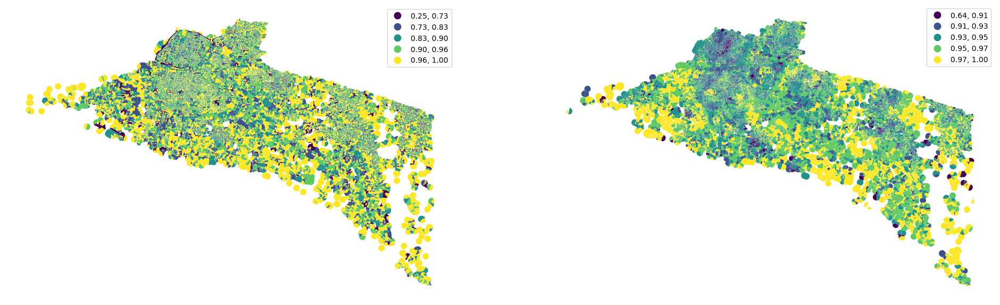

In [45]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
merged.plot(
    percentiles_joined["convexity_50"].values,
    ax=ax[1],
    scheme="natural_breaks",
    legend=True,
)

ax[0].set_axis_off()
ax[1].set_axis_off()

## Clustering

Now we can use obtained values within a cluster analysis that should detect types of urban structure.

Standardize values before clustering.

In [46]:
standardized = (
    percentiles_joined - percentiles_joined.mean()
) / percentiles_joined.std()
standardized.head()

,tess_area_25,tess_area_50,tess_area_75,tess_LAL_25,tess_LAL_50,tess_LAL_75,tess_CCo_25,tess_CCo_50,tess_CCo_75,tess_ERI_25,...,meshedness_75,ldsCDL_25,ldsCDL_50,ldsCDL_75,clusering_25,clusering_50,clusering_75,mtdMDi_25,mtdMDi_50,mtdMDi_75
focal,,,,,,,,,,,,,,,,,,,,,
0,0.607726,0.386565,0.003439,1.440969,0.632309,0.198184,0.488512,-0.057475,-0.838196,0.838376,...,0.252163,0.502607,0.461582,0.969440,-0.138067,-0.301332,-0.524057,-0.613976,-0.177456,-0.318425
1,0.218308,0.356410,-0.041545,0.687949,0.596175,0.158968,0.640027,0.629882,-0.558113,-0.705723,...,-0.765090,0.502607,0.910710,0.969440,-0.138067,-0.301332,-0.524057,-0.330460,0.069587,-0.318425
2,-0.054788,0.333213,-0.062907,0.157211,0.502963,0.139360,0.304082,0.770747,-0.039547,0.195543,...,-1.236446,0.667150,0.884797,0.370672,-0.138067,-0.301332,-0.524057,-0.356014,0.069587,-0.318425
3,-0.105641,0.180878,-0.064495,0.641569,0.615570,0.263068,-1.101629,-0.937340,-1.645016,-1.811330,...,0.252163,0.063528,-0.007855,0.153329,-0.138067,-0.301332,-0.524057,-0.606116,-0.695600,-0.650243
4,-0.226904,-0.192040,-0.133388,-0.010997,0.021632,0.038273,-0.542857,-0.466165,-0.046089,0.022423,...,0.354292,0.502607,0.119904,0.171083,-0.138067,-0.301332,-0.524057,-0.159053,-0.534010,-0.318425


In [52]:
standardized_clean = standardized.drop(["CoA_50","CoA_25"], axis=1)

In [55]:
X = standardized_clean.select_dtypes(include=['number']).copy()

In [59]:
X_1 = X.fillna(0)

In [60]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)            # <-- here
pca_scores = pca.fit_transform(X_1)

In [61]:
pca_scores

array([[-4.56625733e+00,  6.35998621e-01, -2.39421171e+00],
       [-3.99987732e+00,  8.68619587e-01, -2.33611592e+00],
       [-4.53140950e+00, -1.80917728e+00, -1.86714145e+00],
       ...,
       [ 8.62976283e-14, -1.19399422e-14, -2.61145894e-15],
       [ 8.62976283e-14, -1.19399422e-14, -2.61145894e-15],
       [ 8.62976283e-14, -1.19399422e-14, -2.61145894e-15]],
      shape=(39286, 3))

In [63]:
import pandas as pd
pca_df = pd.DataFrame(pca_scores, columns=["PC1", "PC2", "PC3"])
pca_df

,PC1,PC2,PC3
0,-4.566257e+00,6.359986e-01,-2.394212e+00
1,-3.999877e+00,8.686196e-01,-2.336116e+00
2,-4.531409e+00,-1.809177e+00,-1.867141e+00
3,-4.537720e+00,5.748161e-01,-3.419789e+00
4,-4.353636e+00,-2.165004e+00,-2.255301e+00
...,...,...,...
39281,-1.522021e+01,7.349014e+00,7.943189e+00
39282,8.629763e-14,-1.193994e-14,-2.611459e-15
39283,8.629763e-14,-1.193994e-14,-2.611459e-15
39284,8.629763e-14,-1.193994e-14,-2.611459e-15


### How many clusters?

To determine how many clusters we should aim for, we can use a little package called `clustergram`. See its [documentation](https://clustergram.readthedocs.io) for details.

In [64]:
cgram = Clustergram(range(1, 12), n_init=10, random_state=42)
cgram.fit(standardized.fillna(0))

show(cgram.bokeh())

K=1 skipped. Mean computed from data directly.
K=2 fitted in 1.309 seconds.
K=3 fitted in 1.206 seconds.
K=4 fitted in 0.965 seconds.
K=5 fitted in 0.963 seconds.
K=6 fitted in 1.061 seconds.
K=7 fitted in 1.310 seconds.
K=8 fitted in 1.651 seconds.
K=9 fitted in 1.888 seconds.
K=10 fitted in 1.836 seconds.
K=11 fitted in 2.080 seconds.


Clustegram gives us also the final labels. (Normally, you would run the final clustering on much larger number of initialisations.)

In [51]:
cgram.labels.head()

,1,2,3,4,5,6,7,8,9,10,11
0,0,0,2,0,1,5,3,4,6,6,0
1,0,0,2,0,1,5,3,4,6,6,0
2,0,0,2,0,1,5,3,4,6,6,0
3,0,0,0,0,1,5,3,4,6,6,0
4,0,0,2,0,1,5,3,4,6,6,0


In [ ]:
merged["cluster"] = cgram.labels[5].values
buildings["cluster"] = merged["cluster"]
buildings.plot(
    "cluster", categorical=True, figsize=(16, 16), legend=True
).set_axis_off()

### Gaussian

K=1 fitted in 0.612 seconds.
K=2 fitted in 5.153 seconds.
K=3 fitted in 4.724 seconds.
K=4 fitted in 25.443 seconds.
K=5 fitted in 18.382 seconds.
K=6 fitted in 20.626 seconds.
K=7 fitted in 25.331 seconds.


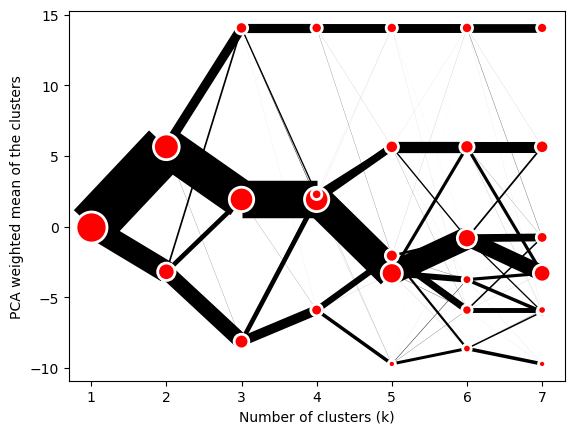

In [ ]:
cgram = Clustergram(range(1, 20), method='gmm')
cgram.fit(standardized.fillna(0))
cgram.plot()

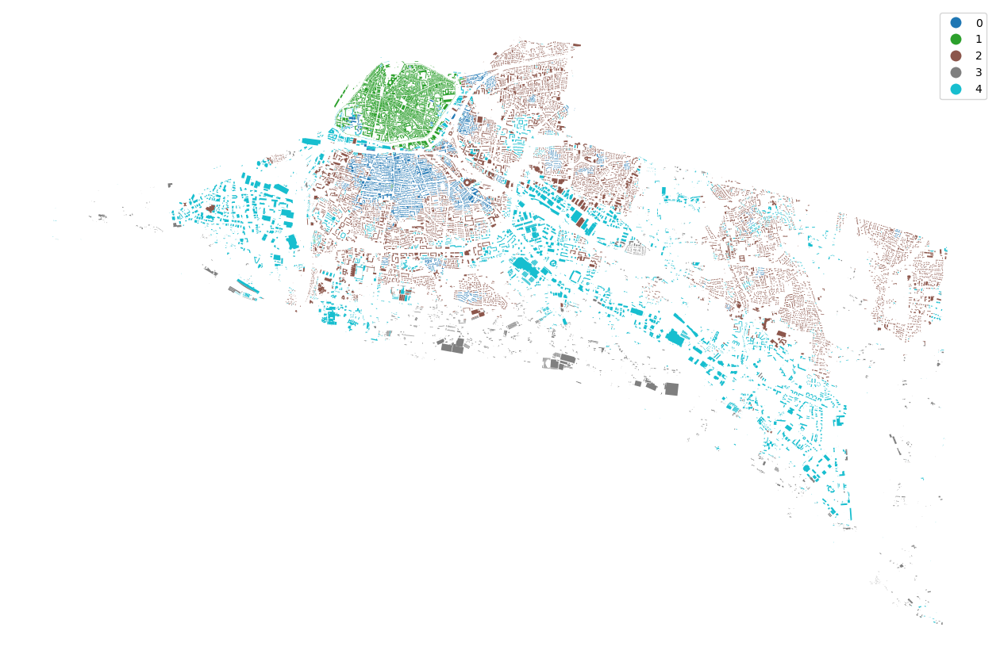

In [69]:
merged["cluster_gaussian"] = cgram.labels[5].values
buildings["cluster_gaussian"] = merged["cluster_gaussian"]
buildings.plot(
    "cluster_gaussian", categorical=True, figsize=(16, 16), legend=True
).set_axis_off()

### PCA Clusters

In [66]:
cgram_pca= Clustergram(range(1, 12), n_init=10, random_state=42)
cgram_pca.fit(pca_df)

show(cgram.bokeh())

K=1 skipped. Mean computed from data directly.
K=2 fitted in 0.089 seconds.
K=3 fitted in 0.087 seconds.
K=4 fitted in 0.117 seconds.
K=5 fitted in 0.158 seconds.
K=6 fitted in 0.150 seconds.
K=7 fitted in 0.149 seconds.
K=8 fitted in 0.241 seconds.
K=9 fitted in 0.257 seconds.
K=10 fitted in 0.296 seconds.
K=11 fitted in 0.363 seconds.


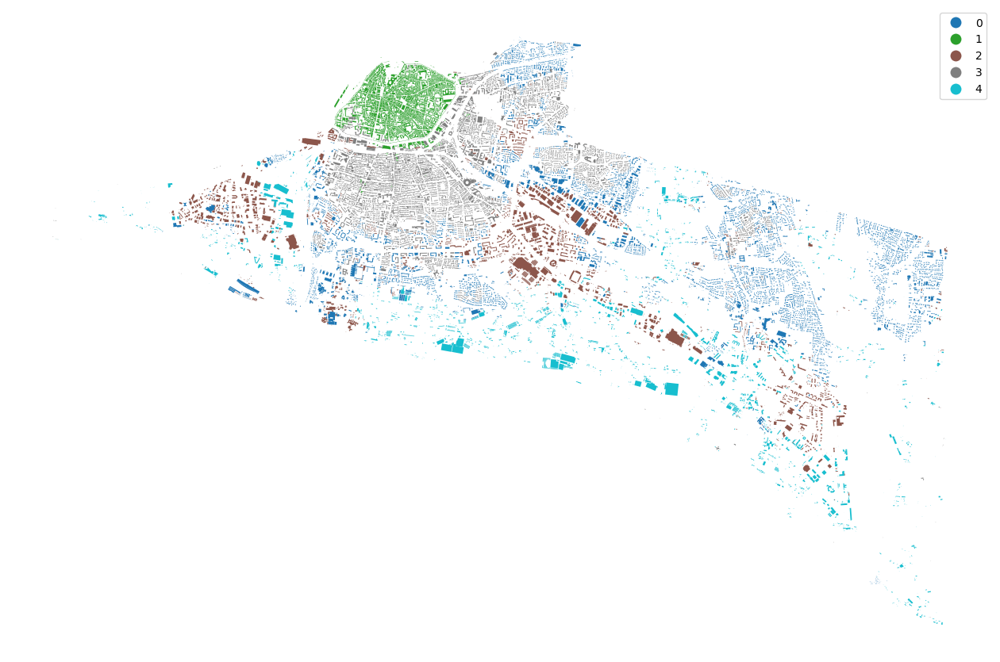

In [ ]:
merged["cluster_pca"] = cgram_pca.labels[5].values
buildings["cluster"] = merged["cluster_pca"]
buildings.plot(
    "cluster_pca", categorical=True, figsize=(16, 16), legend=True
).set_axis_off()

PCA Gaussian Mixture

In [72]:
cgram = Clustergram(range(1, 20), method='gmm')
cgram.fit(pca_df)
show(cgram.bokeh())

K=1 fitted in 0.050 seconds.
K=2 fitted in 0.222 seconds.
K=3 fitted in 0.144 seconds.
K=4 fitted in 0.204 seconds.
K=5 fitted in 0.253 seconds.
K=6 fitted in 0.324 seconds.
K=7 fitted in 0.526 seconds.
K=8 fitted in 0.501 seconds.
K=9 fitted in 0.590 seconds.
K=10 fitted in 0.805 seconds.
K=11 fitted in 1.130 seconds.
K=12 fitted in 0.821 seconds.
K=13 fitted in 0.890 seconds.
K=14 fitted in 0.969 seconds.
K=15 fitted in 0.835 seconds.
K=16 fitted in 1.021 seconds.
K=17 fitted in 0.821 seconds.
K=18 fitted in 0.959 seconds.
K=19 fitted in 0.982 seconds.


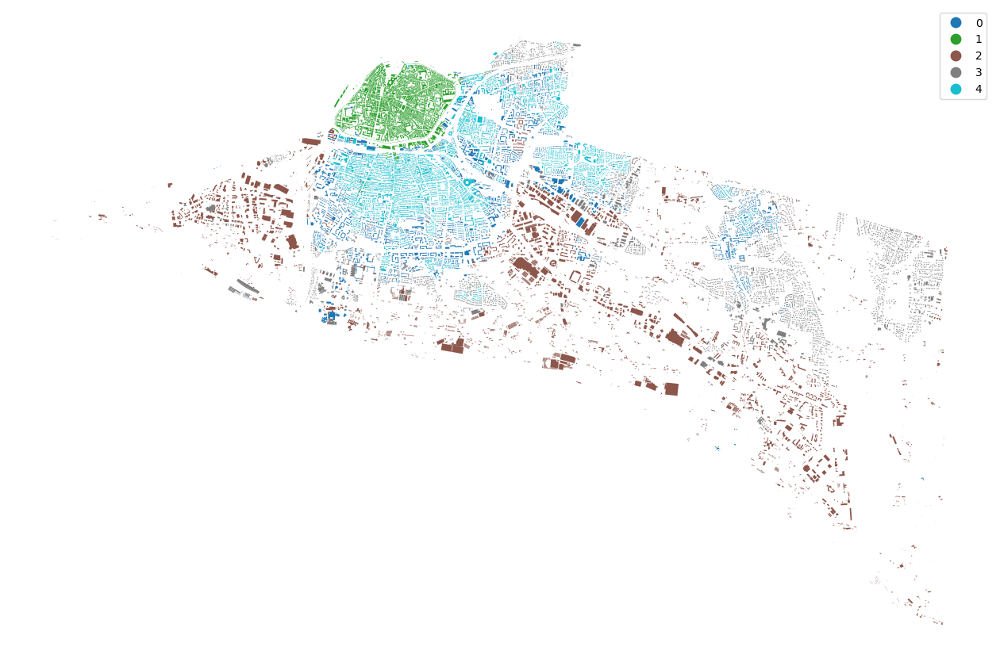

In [71]:
merged["cluster_pca_gaussian"] = cgram.labels[5].values
buildings["cluster_gaussian"] = merged["cluster_pca_gaussian"]
buildings.plot(
    "cluster_gaussian", categorical=True, figsize=(16, 16), legend=True
).set_axis_off()

In [76]:
merged.head()

,geometry,street_index,tess_area,tess_LAL,tess_CCo,tess_ERI,convexity,neighbors,covered_area,car,...,degree,closeness,meshedness,ldsCDL,clusering,mtdMDi,nodeID,cluster,cluster_gaussian,cluster_pca_gaussian
0,"POLYGON ((-310210.647 4914862.593, -310222.036...",20759.0,252.363517,26.384724,0.461564,0.952065,0.956534,0.073279,6278.108150,0.109299,...,1,0.000006,0.000000,224.866278,0.0,150.873195,16673,0,2,3
1,"POLYGON ((-310233.12 4914860.451, -310233.348 ...",20759.0,160.370898,29.875469,0.228774,0.934603,0.934581,0.059034,4339.434112,0.150613,...,1,0.000006,0.000000,224.866278,0.0,150.873195,16673,0,2,3
2,"POLYGON ((-310233.094 4914860.006, -310233.12 ...",20759.0,253.260759,39.618384,0.205440,0.885221,0.915638,0.046101,4675.263790,0.076658,...,1,0.000006,0.000000,224.866278,0.0,150.873195,16673,0,2,3
3,"POLYGON ((-310188.924 4914780.233, -310204.772...",20759.0,2458.329841,74.095942,0.570114,1.037851,0.960361,0.040736,11537.672466,0.070373,...,3,0.000014,0.009524,351.845048,0.0,80.429595,16671,0,2,3
4,"POLYGON ((-310197.397 4914840.508, -310198.303...",20759.0,3361.219326,80.028953,0.668210,1.072794,0.996880,0.027628,4058.192750,0.045235,...,1,0.000006,0.000000,224.866278,0.0,150.873195,16673,0,2,3


In [83]:
# Define the output file path and name
output_path = r"C:\Users\edoar\OneDrive\Desktop\test\final_morphometric_data.gpkg" 

# Save the GeoDataFrame to file
buildings.to_file(output_path, driver="GPKG")

print(f"GeoDataFrame successfully saved to: {output_path}")

GeoDataFrame successfully saved to: C:\Users\edoar\OneDrive\Desktop\test\final_morphometric_data.gpkg


In [82]:
buildings

,geometry,height,street_index,floor_area,CoA,Per,area,Vol,eri,elongation,...,Squ,FF,shared_walls,neighbor_distance,interbuilding_distance,adjacency,edge_index,node_index,cluster,cluster_gaussian
0,"POLYGON ((-310221.405 4914863.983, -310225.022...",1.707255,20759.0,13.454617,0.0,92.067883,27.582961,47.091161,0.977683,0.447911,...,2.432193,5.158196,0.156643,10.889560,21.330315,0.818182,20908.0,16673.0,0,3
1,"POLYGON ((-310225.022 4914864.396, -310221.405...",1.790354,20759.0,12.355492,0.0,92.067883,24.154006,43.244224,0.962048,0.500601,...,2.233453,5.109480,0.445008,8.243843,17.775262,0.692308,20908.0,16673.0,0,3
2,"POLYGON ((-310222.394 4914856.896, -310222.877...",4.849935,20759.0,26.902508,0.0,92.067883,19.414441,94.158778,0.862747,0.477767,...,1.743814,6.055266,0.359111,9.352842,19.778192,0.666667,20908.0,16673.0,0,3
3,"POLYGON ((-310233.408 4914817.823, -310221.644...",6.187273,20759.0,305.827465,0.0,61.866431,172.999673,1070.396127,0.886919,0.557672,...,3.629208,5.311410,0.000000,33.075448,16.744835,0.677419,20908.0,16671.0,0,3
4,"POLYGON ((-310200.44 4914883.629, -310194.169 ...",7.221760,20759.0,313.720240,0.0,54.625646,152.043380,1098.020839,0.904097,0.902771,...,0.473362,5.135061,0.000000,25.724755,14.517444,0.619048,20908.0,16673.0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39331,"POLYGON ((-322204.684 4915171.714, -322192.629...",6.164693,4851.0,321.955700,0.0,232.935267,182.790120,1126.844951,0.852289,0.354339,...,0.371905,5.797361,0.156281,22.259068,47.914912,1.000000,7814.0,4937.0,4,2
39332,"POLYGON ((-322936.215 4915308.231, -322931.248...",0.047072,4.0,0.265304,0.0,18.803679,19.726335,0.928564,1.000280,0.505562,...,0.199912,21.655469,0.000000,172.563487,NaN,1.000000,13.0,6.0,3,0
39333,"POLYGON ((-322966.624 4915131.783, -322965.943...",0.022327,4.0,0.236587,0.0,31.287625,37.087407,0.828055,1.000003,0.228838,...,0.041822,42.850689,0.000000,65.897857,NaN,1.000000,13.0,7.0,3,0
39334,"POLYGON ((-322959.097 4915121.693, -322958.447...",0.017826,4.0,0.146122,0.0,25.056059,28.689205,0.511425,1.000052,0.317028,...,0.036578,45.558886,0.000000,10.390339,NaN,1.000000,13.0,7.0,3,0


In [ ]:
merged.to_file(r"C:\Users\edoar\OneDrive\Desktop\test\znojmo_clusters.shp"), layer="znojmo_clusters", driver="ESRI Shapefile")

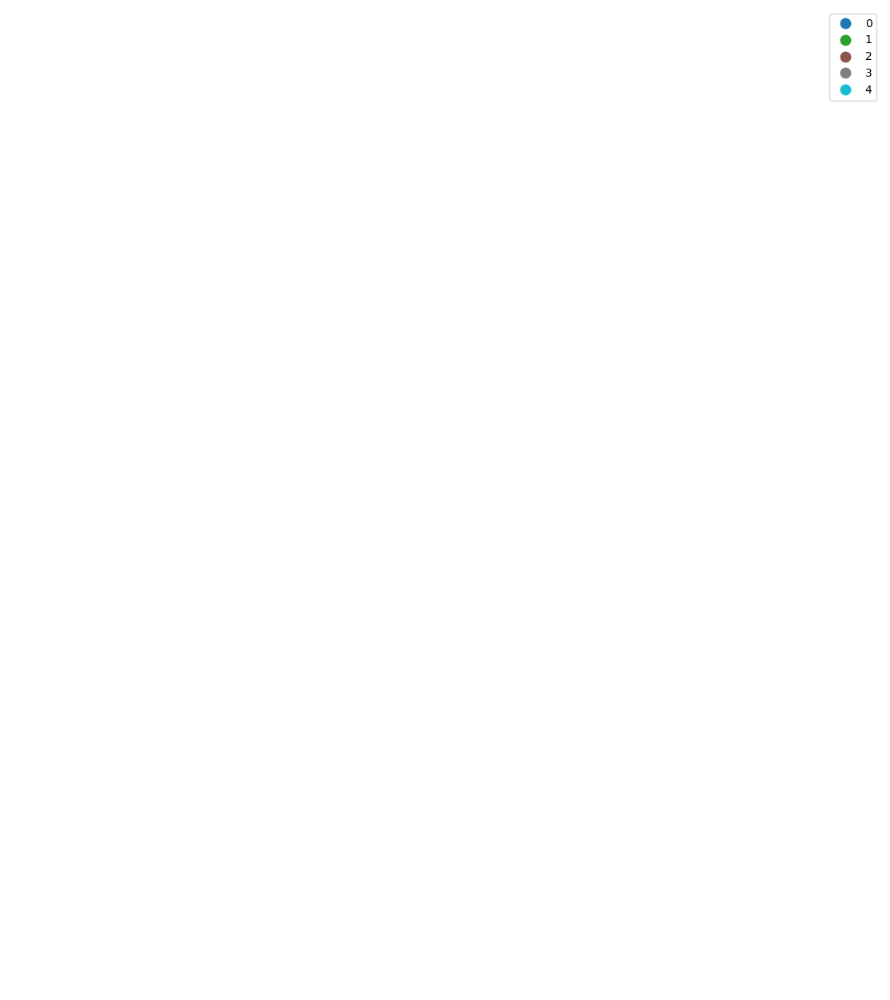

In [42]:
ax = buildings.plot("cluster", categorical=True, figsize=(16, 16), legend=True)
ax.set_xlim(-645000, -641000)
ax.set_ylim(-1195500, -1191000)
ax.set_axis_off()